<a href="https://colab.research.google.com/github/sal3sds/course-collaboration-travel-plans/blob/master/Drone-Weapon-Detection_RF-DETR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
from google.colab import userdata

#os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")


In [2]:
!nvidia-smi

Sat Apr 12 04:32:12 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   31C    P0             45W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [3]:
!pip install -q rfdetr==1.1.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.3/266.3 kB 23.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.6/131.6 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━

In [4]:
from roboflow import download_dataset

dataset = download_dataset("https://app.roboflow.com/rfdetrdrone/my-first-project-hgzjb/1", "coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to My-First-Project-1 in coco:: 100%|██████████| 10117/10117 [00:02<00:00, 4680.75it/s]


In [7]:
%load_ext tensorboard
%tensorboard --logdir /content/output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [6]:
from rfdetr import RFDETRBase

model = RFDETRBase()

model.train(dataset_dir=dataset.location, epochs=50, batch_size=16, grad_accum_steps=1, lr=1e-4, output="/content/drive/MyDrive/Ai_project/output")

rf-detr-base.pth: 100%|██████████| 355M/355M [00:16<00:00, 22.0MiB/s]
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

Loading pretrain weights


reinitializing your detection head with 5 classes.


TensorBoard logging initialized. To monitor logs, use 'tensorboard --logdir output' and open http://localhost:6006/ in browser.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=5, grad_accum_steps=1, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=16, weight_decay=0.0001, epochs=50, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11], freeze_encoder=False, layer_norm=True, rms_norm=False, backbone_lora=False, force_no_pretrain=False, dec_layers=3, dim_feedforward=2048, hidden_dim=256, sa_nheads=8, ca_nheads=

Streaming output truncated to the last 5000 lines.
Test:  [10/53]  eta: 0:00:19  class_error: 0.00  loss: 3.5332 (3.5155)  loss_ce: 0.4473 (0.4464)  loss_bbox: 0.0763 (0.0775)  loss_giou: 0.3261 (0.3292)  loss_ce_0: 0.4688 (0.4670)  loss_bbox_0: 0.0782 (0.0790)  loss_giou_0: 0.3255 (0.3348)  loss_ce_1: 0.4492 (0.4483)  loss_bbox_1: 0.0769 (0.0780)  loss_giou_1: 0.3240 (0.3303)  loss_ce_enc: 0.4785 (0.4739)  loss_bbox_enc: 0.0891 (0.0894)  loss_giou_enc: 0.3697 (0.3617)  loss_ce_unscaled: 0.4473 (0.4464)  class_error_unscaled: 0.0000 (0.0000)  loss_bbox_unscaled: 0.0153 (0.0155)  loss_giou_unscaled: 0.1630 (0.1646)  cardinality_error_unscaled: 262.2500 (260.1818)  loss_ce_0_unscaled: 0.4688 (0.4670)  loss_bbox_0_unscaled: 0.0156 (0.0158)  loss_giou_0_unscaled: 0.1627 (0.1674)  cardinality_error_0_unscaled: 219.9375 (216.7614)  loss_ce_1_unscaled: 0.4492 (0.4483)  loss_bbox_1_unscaled: 0.0154 (0.0156)  loss_giou_1_unscaled: 0.1620 (0.1651)  cardinality_error_1_unscaled: 260.5625 (257.056

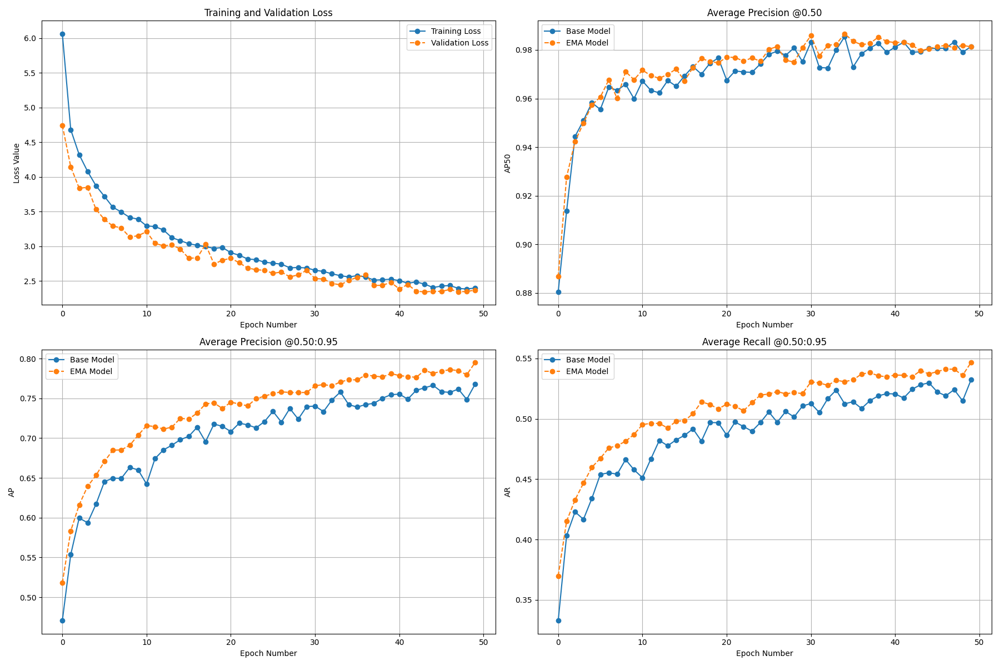

In [8]:
from PIL import Image

Image.open("/content/output/metrics_plot.png")

In [9]:
import supervision as sv

ds = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

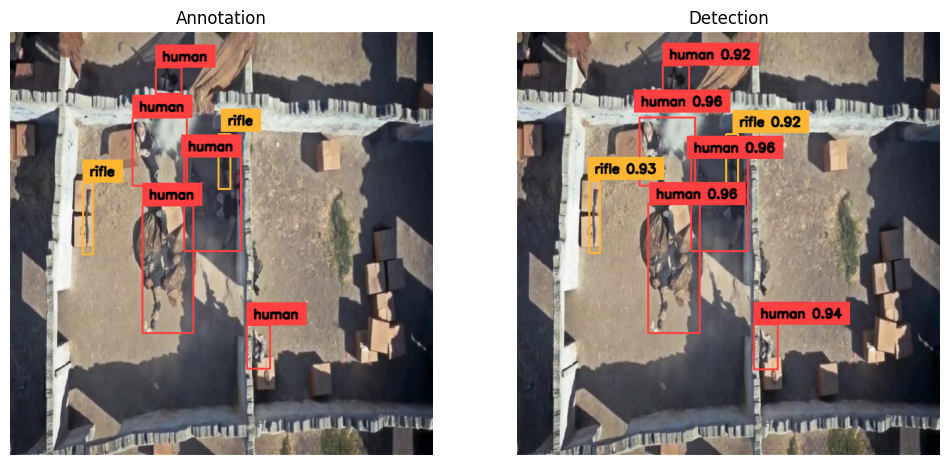

In [10]:
from rfdetr import RFDETRBase
import supervision as sv
from PIL import Image

path, image, annotations = ds[0]
image = Image.open(path)

detections = model.predict(image, threshold=0.5)

text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

bbox_annotator = sv.BoxAnnotator(thickness=thickness)
label_annotator = sv.LabelAnnotator(
    text_color=sv.Color.BLACK,
    text_scale=text_scale,
    text_thickness=thickness,
    smart_position=True)

annotations_labels = [
    f"{ds.classes[class_id]}"
    for class_id
    in annotations.class_id
]

detections_labels = [
    f"{ds.classes[class_id]} {confidence:.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
]

annotation_image = image.copy()
annotation_image = bbox_annotator.annotate(annotation_image, annotations)
annotation_image = label_annotator.annotate(annotation_image, annotations, annotations_labels)

detections_image = image.copy()
detections_image = bbox_annotator.annotate(detections_image, detections)
detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

sv.plot_images_grid(images=[annotation_image, detections_image], grid_size=(1, 2), titles=["Annotation", "Detection"])

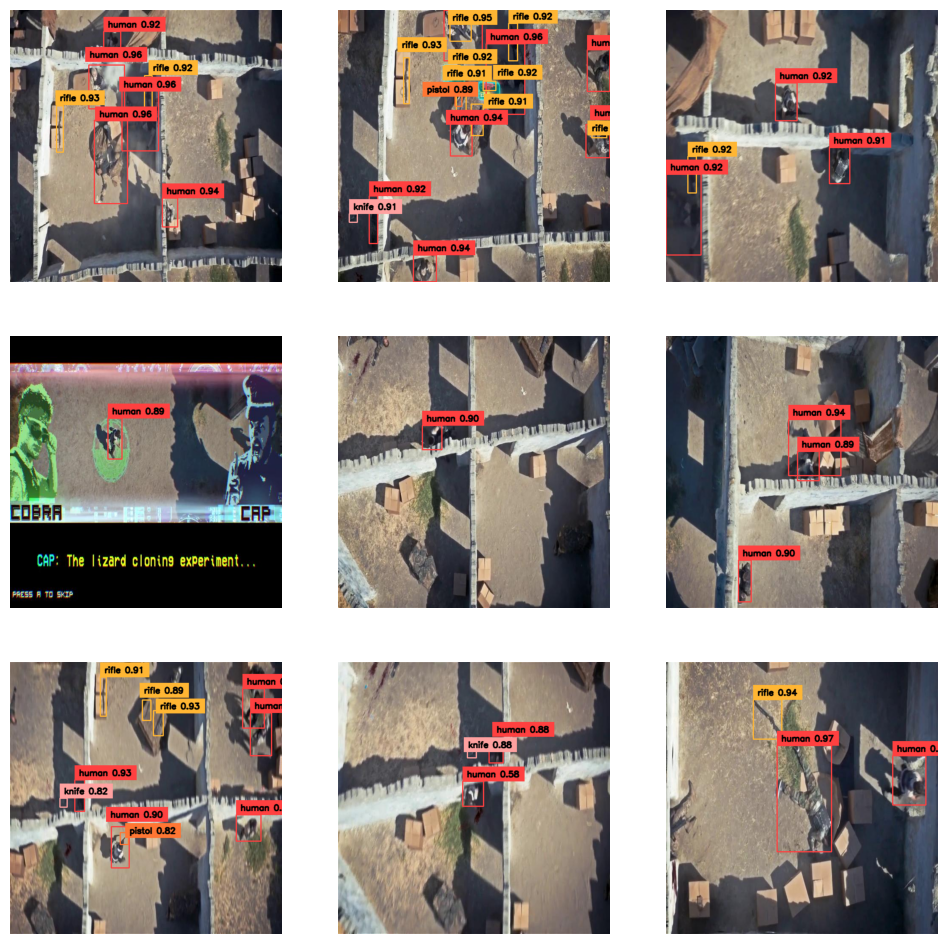

In [11]:
import supervision as sv
from rfdetr import RFDETRBase
from PIL import Image

detections_images = []

for i in range(9):
    path, image, annotations = ds[i]
    image = Image.open(path)

    detections = model.predict(image, threshold=0.5)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    bbox_annotator = sv.BoxAnnotator(thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        text_color=sv.Color.BLACK,
        text_scale=text_scale,
        text_thickness=thickness,
        smart_position=True)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(3, 3), size=(12, 12))

In [12]:
!pwd

/content


In [15]:
import torch

torch.save(model, '/content/drive/MyDrive/rf-detr_full.pth')

In [28]:
import os
from PIL import Image, ImageOps
import supervision as sv
from rfdetr import RFDETRBase
import json

# 1. Load Trained Model
# 2. Automatically Extract Class Names from COCO Annotations
def get_class_names(annotations_path):
    with open(annotations_path) as f:
        coco_data = json.load(f)
    return [category["name"] for category in coco_data["categories"]]

# Path to your COCO annotations (use train/val/test annotations - all should have same classes)
ANNOTATIONS_PATH = "/content/My-First-Project-1/train/_annotations.coco.json"
CLASS_NAMES = get_class_names(ANNOTATIONS_PATH)

print("Detected Classes:", CLASS_NAMES)

Detected Classes: ['objects', 'human', 'knife', 'pistol', 'rifle']


In [29]:
# 3. Image Preprocessing (same as before)
def load_and_resize(image_path, target_size=(640, 640)):
    image = Image.open(image_path).convert("RGB")
    width, height = image.size
    scale = min(target_size[0]/width, target_size[1]/height)
    new_size = (int(width*scale), int(height*scale))
    resized = image.resize(new_size, Image.Resampling.LANCZOS)
    padded = Image.new("RGB", target_size, (114, 114, 114))
    padded.paste(resized, ((target_size[0]-new_size[0])//2, (target_size[1]-new_size[1])//2))
    return padded

In [30]:
# 4. Prediction Function (now uses auto-loaded CLASS_NAMES)
def predict_and_visualize(model, image_path, confidence_threshold=0.5):
    image = load_and_resize(image_path)
    detections = model.predict(image, threshold=confidence_threshold)

    # Visualization setup
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()

    labels = [
        f"{CLASS_NAMES[class_id]} {confidence:.2f}"
        for class_id, confidence in zip(detections.class_id, detections.confidence)
    ]

    annotated_image = image.copy()
    annotated_image = box_annotator.annotate(annotated_image, detections)
    annotated_image = label_annotator.annotate(annotated_image, detections, labels)

    return annotated_image, detections

In [31]:
# 4. Process Single Image Example
input_image = "/content/rgb/5049.jpg"
output_image = "/content/rgb_out/annotated_image.jpg"

annotated_img, detections = predict_and_visualize(model, input_image)
annotated_img.save(output_image)
print(f"Results saved to {output_image}")
print("Detected objects:", [CLASS_NAMES[i] for i in detections.class_id])

Results saved to /content/rgb_out/annotated_image.jpg
Detected objects: ['human']


In [33]:
# 5. Batch Processing (Optional)
def process_folder(input_folder, output_folder, confidence=0.5):
    os.makedirs(output_folder, exist_ok=True)

    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, f"pred_{filename}")

            try:
                annotated_img, _ = predict_and_visualize(model, input_path, confidence)
                annotated_img.save(output_path)
                print(f"Processed {filename}")
            except Exception as e:
                print(f"Error processing {filename}: {e}")

# Usage for batch processing:
process_folder("/content/rgb/", "/content/rgb_out/")

Processed 4381.jpg
Processed 4985.jpg
Processed 4361.jpg
Processed 4025.jpg
Processed 2857.jpg
Processed 4041.jpg
Processed 4137.jpg
Processed 4841.jpg
Processed 4285.jpg
Processed 3073.jpg
Processed 4009.jpg
Processed 4873.jpg
Processed 5203.jpg
Processed 4345.jpg
Processed 2653.jpg
Processed 2720.jpg
Processed 4061.jpg
Processed 2341.jpg
Processed 3813.jpg
Processed 5033.jpg
Processed 3829.jpg
Processed 4860.jpg
Processed 3054.jpg
Processed 4897.jpg
Processed 4121.jpg
Processed 5100.jpg
Processed 5085.jpg
Processed 4809.jpg
Processed 3793.jpg
Processed 2983.jpg
Processed 5081.jpg
Processed 4977.jpg
Processed 5057.jpg
Processed 2329.jpg
Processed 4045.jpg
Processed 4305.jpg
Processed 3189.jpg
Processed 4249.jpg
Processed 5097.jpg
Processed 5205.jpg
Processed 4701.jpg
Processed 5009.jpg
Processed 2761.jpg
Processed 3873.jpg
Processed 2605.jpg
Processed 4153.jpg
Processed 4980.jpg
Processed 4525.jpg
Processed 4122.jpg
Processed 5037.jpg
Processed 4209.jpg
Processed 3773.jpg
Processed 32

In [34]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [35]:
import os

# Change this to whatever folder name you want
save_dir = '/content/drive/My Drive/rf_detr_results'
os.makedirs(save_dir, exist_ok=True)


In [42]:
# 🔒 Save trained model weights
torch.save(model, '/content/drive/My Drive/rf_detr_results/rf_detr_full_model.pth')


In [43]:
import shutil
drive_save_dir = "/content/drive/My Drive/rf_detr_results"
# Copy rf-detr-base.pth (the trained model)
shutil.copy('/content/rf-detr-base.pth', f'{drive_save_dir}/rf-detr-base.pth')

# Copy the whole output directory
shutil.copytree('/content/output', f'{drive_save_dir}/output', dirs_exist_ok=True)


'/content/drive/My Drive/rf_detr_results/output'

In [44]:
shutil.copytree('/content/My-First-Project-1', f'{drive_save_dir}/My-First-Project-1', dirs_exist_ok=True)

'/content/drive/My Drive/rf_detr_results/My-First-Project-1'